# Đồ án cuối kì Lập trình song song

## Thông tin sinh viên

|Họ và tên|MSSV|
|:---:|:---:|
|Võ Thành Nam|19120301|
|Lương Ánh Nguyệt|19120315|

## Tổng quan về đồ án

Ứng dụng được chọn: Seam carving. Seam carving (hay liquid rescaling) là một giải thuật được sử dụng nhằm thay đổi kích thước của một bức ảnh mà vẫn hạn chế tối đa sự biến dạng của các đối tượng trong ảnh. Seam carving được thực hiện bằng cách tìm những đường chưa các pixel ít quan trọng và loại bỏ chúng. Giải thuật này được sử dụng nhiều trong các ứng dụng khi ảnh được sử dụng có kích thước lớn hơn kích thước vùng chứa hiện có, chẳng hạn như khi hiển thị một bức ảnh lớn trên điện thoại.

Ứng dụng này cần phải được tăng tốc vì số lượng pixel càng lớn thì lượng tính toán để tìm ra các pixel cần xóa sẽ càng nhiều và việc thực hiện tuần tự trên CPU sẽ khiến ứng dụng chạy không hiệu quả.

Trong phạm vi đồ án này, giải thuật Seam carving sẽ được giới hạn chỉ giảm kích thước cho chiều rộng của ảnh RGB.
- **Đầu vào:** ảnh RGB.
- **Đầu ra:** ảnh RGB đã được giảm kích thước chiều rộng với số lượng pixel giảm được chỉ định.

Giải thuật sẽ được cài đặt trên CPU và GPU để so sánh hiệu quả. Với GPU sẽ có nhiều phiên bản tối ưu khác nhau để thử nghiệm.

## Phân chia công việc

[Link phân chia công việc](https://docs.google.com/spreadsheets/d/11Sj2kYBxMEYBhSFUUuB-jQHEQs-3TB4przLvOlKYXKw/edit?usp=share_link)

## Chi tiết thực hiện

### Giải thuật
Seam carving có nhiều biến thể khác nhau. Trong đồ án này, nhóm sử dụng giải thuật sau:
- Chuyển đổi hình ảnh từ RGB sang gray.
- Tính toán độ quan trọng (energy) của pixel bằng cách sử dụng sobel convolution.
- Tìm đường seam (đường có độ quan trọng thấp nhất).
- Loại bỏ đường seam khỏi ảnh.
- Lặp lại các bước trên đến khi đạt được kích thước mong muốn.

*Tất cả các thao tác tìm min được thống nhất chọn phần tử **trái nhất**.*

Ảnh đầu vào là một ảnh RGB lưu dưới dạng file pnm và được load vào mảng một chiều có số phần tử bằng $width \times height$

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/ParallelProgramming/Project

Mounted at /content/drive
/content/drive/MyDrive/ParallelProgramming/Project


In [ ]:
from PIL import Image
from IPython.display import display
import numpy as np
def show_pnm(file_name):
    with open(file_name, 'r') as f:
        vals = f.read().split()
    w = int(vals[1])
    h = int(vals[2])
    if vals[0] == 'P2': # Grayscale
        pixels = np.array(vals[4:], dtype=np.uint8).reshape((h, w))
    elif vals[0] == 'P3': # RGB
        pixels = np.array(vals[4:], dtype=np.uint8).reshape((h, w, 3))
    else:
        return None
  
    return Image.fromarray(pixels)

def show_matrix(matrix_file):
    m = np.loadtxt(matrix_file)
    m = m + m.min()
    m = m / m.max()
    m = m * 255
    m = m.astype(np.uint8)
    return Image.fromarray(m)

Trong các phần thử nghiệm, nhóm sẽ dùng ảnh `castle` để chạy giải thuật. Số lượng pixel cần xóa theo chiều rộng là `1000 pixel`. Ảnh mẫu dùng để thử nghiệm:

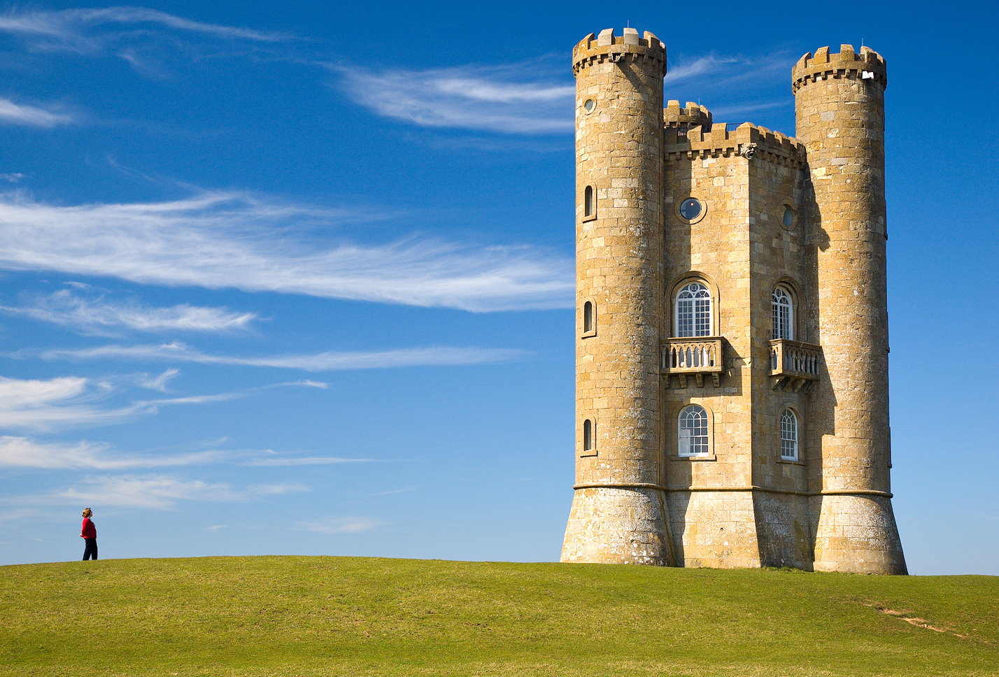

In [ ]:
image = 'castle' # Tên ảnh (không có phần mở rộng)
n_seams = 1000 # Số lượng pixel cần xóa theo chiều rộng
show_pnm(f'./images/{image}.pnm')

### Cài đặt tuần tự

Tương ứng với 4 thao tác của giải thuật, sẽ có 4 hàm thực hiện các chức năng tương ứng
- `convert_RGB_to_gray` để chuyển đổi ảnh ban đầu sang ảnh xám.
- `conv_sobel` để thực hiện tính energy của pixel. Hàm này sẽ sử dụng 4 vòng lặp lồng nhau để duyệt qua các pixel và các giá trị trong kernel convolution.
- `find_seam` để tìm seam cần xóa. Trong hàm này, ta sẽ duyệt qua các hàng từ trên xuống dưới của mảng energy để tính energy cộng dồn và lưu lại đường đi. Energy cộng dồn của pixel và đường đi tại hàng m, cột n sẽ được tính bằng $Accum\_E(m,n) = min(Accum\_E(m-1,n-1),Accum\_E(m-1,n),Accum\_E(m-1,n+1))$ và $path(m,n) = argmin_{n'}(Accum\_E(m-1,n-1),Accum\_E(m-1,n),Accum\_E(m-1,n+1))$. Nếu hàng đang xét là hàng cuối cùng thì thực hiện đồng thời việc lấy giá trị nhỏ nhất và vị trí bắt đầu của seam.
- `remove_seam` để xóa seam tìm được. Sử dụng mảng đường đi để xóa seam, bắt đầu từ hàng cuối cùng của ảnh và kết thúc ở hàng đầu tiên. Các pixel nằm trước vị trí cần xóa thì giữ nguyên, còn lại sẽ dịch sang trái một đơn vị.

```c
for(int i = 0; i < n_seams; i++){
        convert_RGB_to_gray(...);

        conv_sobel(...);

        int col_start_seam = find_seam(...);

        remove_seam(..., col_start_seam);
        width -= 1;
    }
```

In [ ]:
!nvcc support.cu host1.cu -o host1
!./host1 images/{image}.pnm {n_seams}

**********GPU info**********
Name: Tesla T4
Compute capability: 7.5
Num SMs: 40
Max num threads per SM: 1024
Max num warps per SM: 32
GMEM: 15843721216 byte
SMEM per SM: 65536 byte
SMEM per block: 49152 byte
****************************
Image size (width x height): 1428 x 968

Time: 154681.609 ms


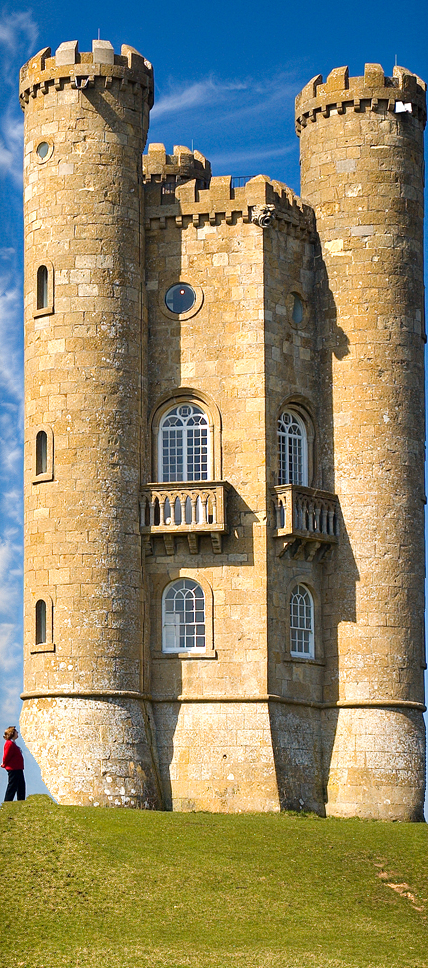

In [ ]:
show_pnm(f'./images/{image}_host1.pnm')

Kết quả đầu ra của giải thuật khá tốt. Tổng thời gian chạy khoảng `2p30s`. Tốc độ thực thi của giải thuật trên CPU là quá chậm.

### Cài đặt song song

#### Phiên bản 1

Tương tự như việc cài đặt tuần tự, sẽ có các kernel như sau:
- `convert_RGB_to_gray` để chuyển ảnh màu thành ảnh xám. Cách triển khai kernel này giống với cách đã làm trong phần 1 bài HW1.
- `conv_sobel` để tính toán độ quan trọng của pixel. Trong kernel này, mỗi `thread` sẽ đảm nhiệm việc tính convolution cho một pixel, tương tự như cách làm trong phần 2 của HW1.
- `find_seam` để tính energy cộng dồn tại mỗi hàng. Để tìm các seam, kernel này sẽ được lặp qua các hàng, từ trên xuống dưới. Khi thực hiện cộng dồn energy, kernel này cũng lưu lại vị trí cột của pixel được cộng.
- `find_min_index` để tìm vị trí bắt đầu của seam trên hàng cuối cùng. Sau khi đã lặp qua tất cả các hàng, ta sẽ có energy ở hàng cuối cùng. Ý tưởng cho việc tìm min giống với việc thực hiện scan work-inefficient trong bài Scan. Với các `stride = blockDim.x >> 1; stride > 0; stride >>= 1` và mảng `index` chứa index của các phần tử, thực hiện so sánh:
    - Nếu `in[threadIdx.x] > in[threadIdx.x + stride]` thì hoán vị chúng và hoán vị `index[blockDim.x * blockIdx.x + threadIdx.x]`,`index[blockDim.x * blockIdx.x + threadIdx.x + stride]`
    - Nếu `in[threadIdx.x] == in[threadIdx.x + stride]` thì `index[blockDim.x * blockIdx.x + threadIdx.x]` =`min(index[blockDim.x * blockIdx.x + threadIdx.x],index[blockDim.x * blockIdx.x + threadIdx.x + stride]`)
    
    Thread 0 của mỗi block sẽ lưu giá trị nhỏ nhất cũng như vị trí của phần tử đó trong mảng, thực hiện so sánh như trên giữa các block ta sẽ có được vị trí của phần tử nhỏ nhất lưu ở `index[0]`.
- Có được vị trí của seam và mảng truy vết, ta sẽ lấy vị trí các pixel nằm trên seam thông qua host.
- `remove_seam` dùng để xóa seam. Tương tự như trên host, tuy nhiên ở device thì việc xóa seam sẽ thực hiện đồng thời ở tất cả các hàng của bức ảnh.

In [ ]:
!nvcc support.cu device1.cu -o device1
!./device1 images/{image}.pnm {n_seams}

**********GPU info**********
Name: Tesla T4
Compute capability: 7.5
Num SMs: 40
Max num threads per SM: 1024
Max num warps per SM: 32
GMEM: 15843721216 byte
SMEM per SM: 65536 byte
SMEM per block: 49152 byte
****************************
Image size (width x height): 1428 x 968

Time: 4185.964 ms
Output image size (width x height): 428 x 968



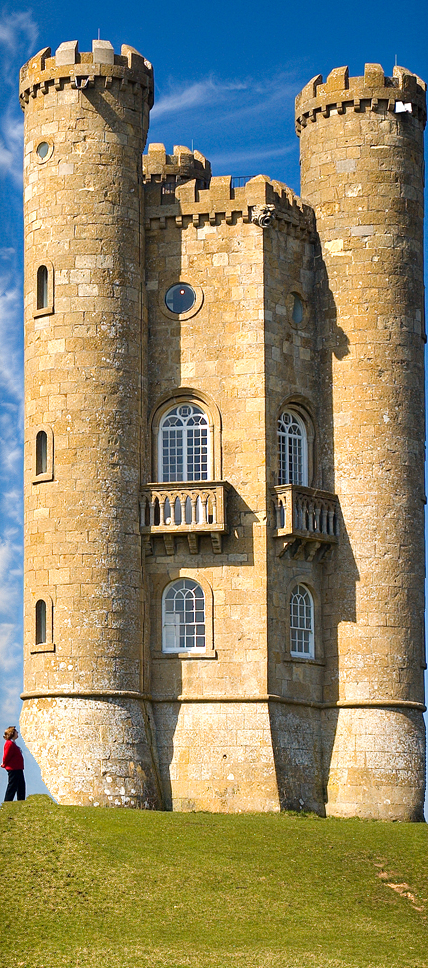

In [ ]:
show_pnm(f'./images/{image}_device1.pnm')

Phiên bản 1 cho ra kết quả giống với việc thực thi trên host. Tuy nhiên tốc độ thực thi trên GPU là tốt hơn rất nhiều so với CPU khi chỉ tốn khoảng `4.1s`. Việc song song hóa đã giúp cho nhiều thao tác nhanh hơn rất nhiều so với thực thi tuần tự trên CPU.

#### Phiên bản 2

Ở phiên bản 1, nhóm nhận thấy việc chuyển đổi ảnh màu sang ảnh xám và tính toán energy có thể gộp chung vào 1 kernel. Do đó, phiên bản 2 sẽ có kernel `convert_RGB_to_energy` thay cho 2 kernel `convert_RGB_to_gray` và `conv_sobel`.

In [ ]:
!nvcc support.cu device2.cu -o device2
!./device2 images/{image}.pnm {n_seams}

**********GPU info**********
Name: Tesla T4
Compute capability: 7.5
Num SMs: 40
Max num threads per SM: 1024
Max num warps per SM: 32
GMEM: 15843721216 byte
SMEM per SM: 65536 byte
SMEM per block: 49152 byte
****************************
Image size (width x height): 1428 x 968

Time: 4221.303 ms
Output image size (width x height): 428 x 968



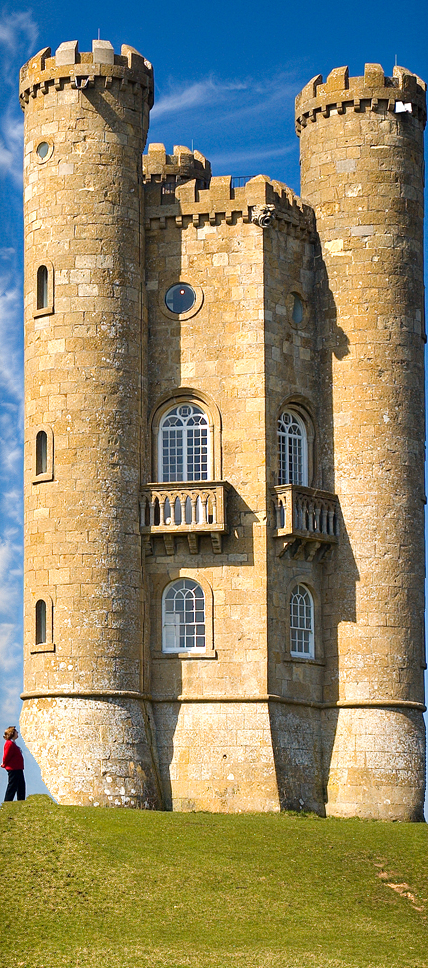

In [ ]:
show_pnm(f'./images/{image}_device2.pnm')

Phiên bản 2 cũng cho ra kết quả đúng. Việc gộp 2 kernel không cho thấy hiệu quả khi thời gian thực thi cũng chỉ xấp xỉ phiên bản 1.

#### Phiên bản 3

Ở kernel`convert_RGB_to_energy`, thao tác gọi các pixel để tính toán sẽ truy xuất vùng nhớ global rất nhiều lần và có thể làm giảm tốc độ tính toán, do đó nhóm sẽ thiết kế để sử dụng share memory. Mỗi kernel sẽ thực hiện sao chép những pixel mà các thread sẽ dùng để tính toán từ GMEM vào SMEM. Kích thước của vùng nhớ này sẽ là `(blockDim.x + 2) * (blockDim.y + 2) * sizeof(...)`

In [ ]:
!nvcc support.cu device3.cu -o device3
!./device3 images/{image}.pnm {n_seams}

**********GPU info**********
Name: Tesla T4
Compute capability: 7.5
Num SMs: 40
Max num threads per SM: 1024
Max num warps per SM: 32
GMEM: 15843721216 byte
SMEM per SM: 65536 byte
SMEM per block: 49152 byte
****************************
Image size (width x height): 1428 x 968

Time: 4132.036 ms
Output image size (width x height): 428 x 968



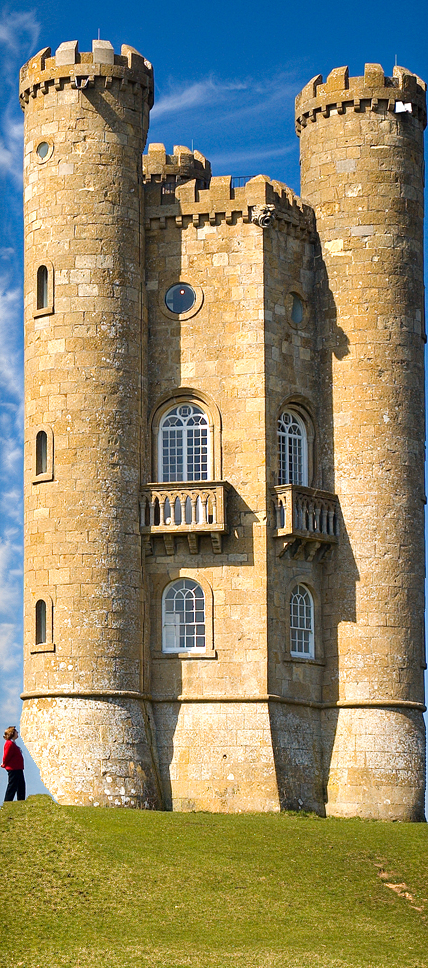

In [ ]:
show_pnm(f'./images/{image}_device3.pnm')

Phiên bản 3 cho ra kết quả đúng. Tốc độ thực thi của phiên bản 3 có nhanh hơn nhưng gần như là không đáng kể. Về vấn đề này, nhóm cho rằng có thể do nguyên nhân sau:
- Kernel của phép tích chập sobel là quá nhỏ để tạo ra khác biệt khi dùng share memory. Mỗi thread khi thực hiện tích chập sẽ truy cập vào 9 phần tử, bao gồm 1 phần tử trung tâm và 8 phần tử lân cận. Khi sử dụng share mem ta chỉ làm giảm được các truy xuất ở phần tử lân cận trên GMEM, tuy nhiên ta lại tốn thêm chi phí lưu trữ vào và truy xuất từ SMEM.

#### Phiên bản 4

Các convolution kernel được sử dụng rất nhiều lần trong mỗi thread, do đó nhóm sẽ khai báo 2 mảng này ở CMEM thay vì khai báo trực tiếp trong kernel.

In [ ]:
!nvcc support.cu device4.cu -o device4
!./device4 images/{image}.pnm {n_seams}

**********GPU info**********
Name: Tesla T4
Compute capability: 7.5
Num SMs: 40
Max num threads per SM: 1024
Max num warps per SM: 32
GMEM: 15843721216 byte
SMEM per SM: 65536 byte
SMEM per block: 49152 byte
****************************
Image size (width x height): 1428 x 968

Time: 4179.941 ms
Output image size (width x height): 428 x 968



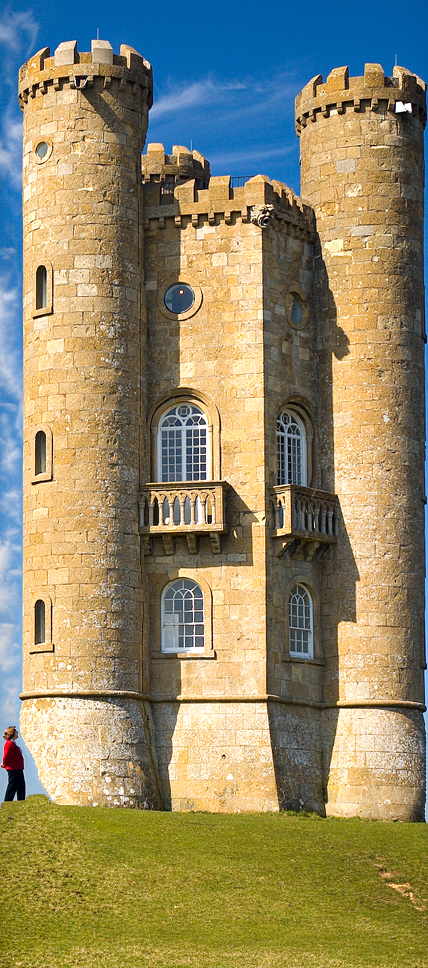

In [ ]:
show_pnm(f'./images/{image}_device4.pnm')

Tốc độ thực thi gần như không thay đổi so với khi không dùng CMEM. Điều này có thể do khi khai báo các convolution kernel trong cuda kernel, compiler đã tự optimize vị trí lưu trữ để đạt được tốc độ tối ưu.

#### Phiên bản 5

Thử nghiệm tối ưu `find_min_index` bằng kernel 7 trong [Reduction tutorial](https://developer.download.nvidia.com/assets/cuda/files/reduction.pdf) của nvidia. Việc tìm min index giữa các block sẽ được thực hiện bởi host thay vì làm trực tiếp trên device.

In [ ]:
!nvcc support.cu device5.cu -o device5
!./device5 images/{image}.pnm {n_seams}

**********GPU info**********
Name: Tesla T4
Compute capability: 7.5
Num SMs: 40
Max num threads per SM: 1024
Max num warps per SM: 32
GMEM: 15843721216 byte
SMEM per SM: 65536 byte
SMEM per block: 49152 byte
****************************
Image size (width x height): 1428 x 968

Time: 4206.303 ms
Output image size (width x height): 428 x 968



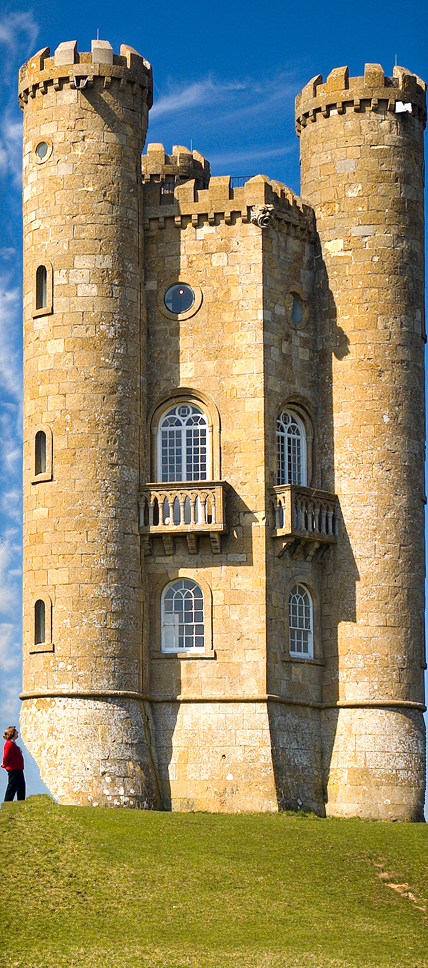

In [ ]:
show_pnm(f'./images/{image}_device5.pnm')

Kết quả cũng gần như không có sự thay đổi so với các phiên bản trước đó. Điều này do kích thước chiều rộng của ảnh không lớn nên việc tìm min giữa các block trên host hay trên device không có sự khác biệt.

### Thực nghiệm

#### Phần cứng

Trong đồ án này, nhóm sử dụng GPU của google colab để chạy thực nghiệm. Cấu hình của google colab
- CPU

```

```
- GPU

```
    Name: Tesla T4
    Compute capability: 7.5
    Num SMs: 40
    Max num threads per SM: 1024
    Max num warps per SM: 32
    GMEM: 15843721216 byte
    SMEM per SM: 65536 byte
    SMEM per block: 49152 byte
```

#### Kết quả

Đơn vị thời gian là *ms*

|Image|Castle.pnm (1428 x 968)|||
|:---:  |:---:     |:---:     |:---:      |
|seam   |250       |500       |1000       |
|host1  |51468.9217|92435.5108|145233.7407|
|device1|1033.6377 |1992.9626 |3747.818   |
|device2|1040.484  |1950.1178 |3782.5808  |
|device3|1047.4421 |1958.7995 |3758.9487  |
|device4|1050.4775 |2009.0039 |3822.196   |
|device5|1057.5184 |1935.7441 |3749.8816  |

### Nhận xét

Nhóm đã thực hiện song song hóa trên GPU và một số chiến lược khác nhau để tối ưu hóa tốc độ. Thực nghiệm cho thấy tốc độ thực thi trên GPU nhanh hơn rất nhiều so với tuần tự trên CPU. Tuy nhiên việc tối ưu hóa trên GPU vẫn chưa cho được kết quả như mong đợi khi các phiên bản gần như không có sự thay đổi về tốc độ.

## Tổng kết

1. Võ Thành Nam:
- Một số khó khăn gặp phải:
    - Triển khai giải thuật song song trên GPU khá khó để debug, đặc biệt là những lỗi liên quan đến vùng nhớ vì compiler không cho biết chính xác vị trí bị lỗi.
    - Gặp một số khó khăn khi chia việc vì tốc độ làm việc của mỗi người khác nhau.
    - Không có nhiều thời gian để thực hiện những chiến lược tối ưu khác.
- Các bài học đã học được:
    - Biết thêm về các vùng nhớ trong cuda.
    - Biết thêm được một số kĩ thuật trong xử lí ảnh.
2. Lương Ánh Nguyệt:
- Một số khó khăn gặp phải:

- Các bài học đã học được:

3. Với cả nhóm:
Nếu có thêm thời gian, nhóm sẽ thực hiện thêm các tối ưu ở bước quy hoạch động vì nhóm đã thử thực hiện nhưng chưa thành công. Ngoài ra nhóm cũng sẽ thử tìm thêm giải thuật khác cho bước tính energy.

## Tài liệu tham khảo

1. Slide bài giảng.
2. [Cuda reduction tutorial](https://developer.download.nvidia.com/assets/cuda/files/reduction.pdf)
3. [Github-kalpeshdusane](https://github.com/kalpeshdusane/Seam-Carving-B.E.-Project)